# Исследование объявлений о продаже квартир

В распоряжении данные из архива объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Задача — установить параметры, от которых зависит стоимость.

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 

### Описание данных
airports_nearest — расстояние до ближайшего аэропорта в метрах (м)<br>
balcony — число балконов<br>
ceiling_height — высота потолков (м)<br>
cityCenters_nearest — расстояние до центра города (м)<br>
days_exposition — сколько дней было размещено объявление (от публикации до снятия)<br>
first_day_exposition — дата публикации<br>
floor — этаж<br>
floors_total — всего этажей в доме<br>
is_apartment — апартаменты (булев тип)<br>
kitchen_area — площадь кухни в квадратных метрах (м²)<br>
last_price — цена на момент снятия с публикации<br>
living_area — жилая площадь в квадратных метрах(м²)<br>
locality_name — название населённого пункта<br>
open_plan — свободная планировка (булев тип)<br>
parks_around3000 — число парков в радиусе 3 км<br>
parks_nearest — расстояние до ближайшего парка (м)<br>
ponds_around3000 — число водоёмов в радиусе 3 км<br>
ponds_nearest — расстояние до ближайшего водоёма (м)<br>
rooms — число комнат<br>
studio — квартира-студия (булев тип)<br>
total_area — площадь квартиры в квадратных метрах (м²)<br>
total_images — число фотографий квартиры в объявлении

### План работы:
<a href='#the_destination'>Шаг 1. Получение общей информации и подготвка данных.</a><br>
На первом этапе импортируем необходимые библиотеки и читаем файл, знакомимся с общей информацией, выставляем необходимые типы данных, проверяем пропуски, дубликаты<br>
<a href='#the_destination_2'>Шаг 2. Добавление фичей для дальнейшего анализа</a><br>
Добавление необходимых фичей для дальнейшего анализа.<br>
<a href='#the_destination_3'>Шаг 3. Исследовательский анализ данных.</a><br>
Проведение исследовательского анализа данных. Выделение и изучение различных групп квартир.<br>
<a href='#the_destination_final'>Шаг 4. Общий вывод.</a><br>

## Изучение общей информации и подготовка данных

### План работы:
<a href='#the_destination'>Шаг 1. Получение общей информации и подготвка данных.</a><br>
<a href='#the_destination_2'>Шаг 2. Добавление фичей</a><br>
<a href='#the_destination_3'>Шаг 3. Исследовательский анализ данных.</a><br>
<a href='#the_destination_final'>Шаг 4. Общий вывод.</a><br>

<a id='the_destination'></a>

In [1]:
import pandas as pd
data = pd.read_csv('/datasets/real_estate_data.csv',sep ='\t')
display(data.head())
data.isna().sum()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,...,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,...,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
cityCenters_nearest      5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

<pre>
    Столбец с кол-вом этажей типа float - должен быть int. Столбец с датой публикации: вместо object - datetime. Столбец апартаменты должны быть bool. Столбец с кол-вом балконов должны быть типа int. Расстояния до объектов можно сделать типа int. Столбец с числом водоемов надо сделать int. Кол-во дней до снятия объявления тоже сделать Int.
    Пропуски присутствуют в большинстве столбцов в разных количествах. Можно выдвинуть предположение, что автоматическая система определения расстояния до различных объектов (водоем, аэропот, парк) работает некорректно из-за огромного процента пропусков в колонках с расстояними.
    Пропуски в столбцах со значениями, которые вбивает человек, могли появиться в результате отсутствия какого-либо параметра, например, в квартире нет балконов: вместо '0' ничего не писали.
    Почти все данные в столбце апартаменты являются Nan-ами, возможно, данные в этот столбец заносятся редко, может это связано с особенностями работы в данной сфере, было бы неплохо уточниться у специалиста. Перевод столбца в тип bool не производим, потому что все Nan-ы будут засчитаны как False.</pre>

In [2]:
def change_type_float_to_int(column):
    data[column] = data[column].round()
    data[column] = data[column].astype('Int64')

In [3]:
columns = [
    'floors_total','last_price', 'balcony','last_price',
    'ponds_around3000', 'parks_nearest', 'parks_around3000',
    'ponds_nearest', 'days_exposition', 'airports_nearest', 'cityCenters_nearest']
(lambda x:change_type_float_to_int(x))(columns)
data['last_price'] = data['last_price'].astype('int64')

Странно, но при внесении столбца 'last_price' в список 'columns', на выходе после функции он имеет тип 'object', поэтому его изменение типа прописанно отдельно.

In [4]:
def round_columns(columns):
    for column in columns:
        data[column] = data[column].round(1)
        
columns_for_round = ['ceiling_height', 'living_area', 'total_area', 'kitchen_area']
round_columns(columns_for_round)

In [5]:
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'], format = '%Y-%m-%dT%H:%M:%S')
display(data.dtypes)
data.head()

total_images                     int64
last_price                       int64
total_area                     float64
first_day_exposition    datetime64[ns]
rooms                            int64
ceiling_height                 float64
floors_total                     Int64
living_area                    float64
floor                            int64
is_apartment                    object
studio                            bool
open_plan                         bool
kitchen_area                   float64
balcony                          Int64
locality_name                   object
airports_nearest                 Int64
cityCenters_nearest              Int64
parks_around3000                 Int64
parks_nearest                    Int64
ponds_around3000                 Int64
ponds_nearest                    Int64
days_exposition                  Int64
dtype: object

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000,108.0,2019-03-07,3,2.7,16,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863,16028,1,482,2,755,NaN
1,7,3350000,40.4,2018-12-04,1,NaN,11,18.6,1,NaN,...,11.0,2,посёлок Шушары,12817,18603,0,NaN,0,NaN,81
2,10,5196000,56.0,2015-08-20,2,NaN,5,34.3,4,NaN,...,8.3,0,Санкт-Петербург,21741,13933,1,90,2,574,558
3,0,64900000,159.0,2015-07-24,3,NaN,14,NaN,9,NaN,...,NaN,0,Санкт-Петербург,28098,6800,2,84,3,234,424
4,2,10000000,100.0,2018-06-19,2,3.0,14,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856,8098,2,112,1,48,121


Изменил тип необходимыех столбцов на int (кол-во этажей, расстояние до объектов, кол-во блаконов, кол-во объектов в радиусе 3км) и дату на тип datetime. Округлил высоту потолков, площадь кухни и жилую площадь до 1 знака после запятой.

In [6]:
data.dropna(subset = ['locality_name'], inplace = True)
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9160
floors_total               85
living_area              1898
floor                       0
is_apartment            20890
studio                      0
open_plan                   0
kitchen_area             2269
balcony                 11513
locality_name               0
airports_nearest         5534
cityCenters_nearest      5511
parks_around3000         5510
parks_nearest           15586
ponds_around3000         5510
ponds_nearest           14565
days_exposition          3180
dtype: int64

Убираем пропуски в столбце с названием населенного пункта - значений очень мало и без названия города нас вряд ли интересуют данные о квартире.

In [7]:
data['balcony'] = data['balcony'].fillna(0)
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9160
floors_total               85
living_area              1898
floor                       0
is_apartment            20890
studio                      0
open_plan                   0
kitchen_area             2269
balcony                     0
locality_name               0
airports_nearest         5534
cityCenters_nearest      5511
parks_around3000         5510
parks_nearest           15586
ponds_around3000         5510
ponds_nearest           14565
days_exposition          3180
dtype: int64

Заполнил пустые значения с балконами нулевыми значениями - будем считать, что данные были незаполнены по причине отсутствия балконов.
Большое кол-во пропусков в количестве ближайших парков и водоемов может быть связаны с их отсутствием в черте населенного пункта, видимо строки оставляли пустыми. Заменять значения не буду, чтобы не искажать данные. Стоит обратить внимание и на то, что кол-во объектов на расстоянии до 3км занесено больше, чем пропущено в ближайших объектах - возможно автоматическая система не смогла точно определять ближайший объект, нужно доложить или уточнить у разработчиков.

In [8]:
data.dropna(subset = ['floors_total'], inplace = True)
data = data.reset_index(drop = True)
data_group_locality_name_of_ceiling_height = data.groupby('locality_name')['ceiling_height'].agg('median').to_dict()
data_group_locality_name_of_ceiling_height

{'Бокситогорск': 3.9,
 'Волосово': 2.5,
 'Волхов': 2.6,
 'Всеволожск': 2.7,
 'Выборг': 2.6,
 'Высоцк': 2.5,
 'Гатчина': 2.6,
 'Зеленогорск': 2.6,
 'Ивангород': 2.5,
 'Каменногорск': 2.6,
 'Кингисепп': 2.5,
 'Кириши': 2.5,
 'Кировск': 2.5,
 'Колпино': 2.5,
 'Коммунар': 2.6,
 'Красное Село': 2.6,
 'Кронштадт': 2.6,
 'Кудрово': 2.7,
 'Лодейное Поле': 2.55,
 'Ломоносов': 2.6,
 'Луга': 2.5,
 'Любань': 2.5,
 'Мурино': 2.7,
 'Никольское': 2.6,
 'Новая Ладога': 2.5,
 'Отрадное': 2.6,
 'Павловск': 2.6,
 'Петергоф': 2.6,
 'Пикалёво': 2.6,
 'Подпорожье': 2.6,
 'Приморск': 2.5,
 'Приозерск': 2.5,
 'Пушкин': 2.6,
 'Санкт-Петербург': 2.7,
 'Светогорск': 2.5,
 'Сертолово': 2.6,
 'Сестрорецк': 2.7,
 'Сланцы': 2.5,
 'Сосновый Бор': 2.5,
 'Сясьстрой': 2.55,
 'Тихвин': 2.6,
 'Тосно': 2.5,
 'Шлиссельбург': 2.5,
 'городской поселок Большая Ижора': 2.6,
 'городской поселок Янино-1': 2.75,
 'городской посёлок Будогощь': 2.6,
 'городской посёлок Виллози': 2.6,
 'городской посёлок Лесогорский': 2.6,
 'городско

Создал сводную таблицу с медианным значением высоты потолка по названию пункта и перевел в словарь для дальнейшей замены в основной таблице. Удалил строки с пропусками количества этажей. Обновил индексы.

In [9]:
n = -1
for i in data['ceiling_height'].isna():
    n += 1
    if i == True:
        name_of_city = data.loc[n,'locality_name']
        data.loc[n,'ceiling_height'] = data_group_locality_name_of_ceiling_height[name_of_city]
data['is_apartment'].fillna(False, inplace = True)
data.head()        

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000,108.0,2019-03-07,3,2.7,16,51.0,8,False,...,25.0,0,Санкт-Петербург,18863,16028,1,482,2,755,NaN
1,7,3350000,40.4,2018-12-04,1,2.6,11,18.6,1,False,...,11.0,2,посёлок Шушары,12817,18603,0,NaN,0,NaN,81
2,10,5196000,56.0,2015-08-20,2,2.7,5,34.3,4,False,...,8.3,0,Санкт-Петербург,21741,13933,1,90,2,574,558
3,0,64900000,159.0,2015-07-24,3,2.7,14,NaN,9,False,...,NaN,0,Санкт-Петербург,28098,6800,2,84,3,234,424
4,2,10000000,100.0,2018-06-19,2,3.0,14,32.0,13,False,...,41.0,0,Санкт-Петербург,31856,8098,2,112,1,48,121


Заменил nan-ы в столбце высоты потолка на медианое значение в каждом населенному пункте из словаря и заполнил апартаменты False.

## Добавление фичей для дальнейшего анализа

### План работы:
<a href='#the_destination'>Шаг 1. Получение общей информации и подготвка данных.</a><br>
<a href='#the_destination_2'>Шаг 2. Добавление фичей</a><br>
<a href='#the_destination_3'>Шаг 3. Исследовательский анализ.</a><br>
<a href='#the_destination_final'>Шаг 4. Общий вывод.</a><br>

<a id='the_destination_2'></a>

In [10]:
data['cost_per_metr'] = (data['last_price'] / data['total_area']).astype('int')
data['day_exposition'] = data['first_day_exposition'].dt.day_name()
data['month_exposition'] = data['first_day_exposition'].dt.month_name()
data['year_exposition'] = data['first_day_exposition'].dt.year

In [11]:
def floor_group(row):
    if row['floor'] == row['floors_total']:
        group_floor = 'последний'
    elif row['floor'] == 1:
        group_floor = 'первый'
    else:
        group_floor = 'другой'
    return group_floor
data['group_floor'] = data.apply(lambda x: floor_group(x),axis = 1)

In [12]:
data['ratio_living_area_on_total_area'] = data['living_area'] / data['total_area']
data['ratio_kitchen_area_on_total_area'] = data['kitchen_area'] / data['total_area']
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_around3000,ponds_nearest,days_exposition,cost_per_metr,day_exposition,month_exposition,year_exposition,group_floor,ratio_living_area_on_total_area,ratio_kitchen_area_on_total_area
0,20,13000000,108.0,2019-03-07,3,2.7,16,51.0,8,False,...,2,755,NaN,120370,Thursday,March,2019,другой,0.472222,0.231481
1,7,3350000,40.4,2018-12-04,1,2.6,11,18.6,1,False,...,0,NaN,81,82920,Tuesday,December,2018,первый,0.460396,0.272277
2,10,5196000,56.0,2015-08-20,2,2.7,5,34.3,4,False,...,2,574,558,92785,Thursday,August,2015,другой,0.612500,0.148214
3,0,64900000,159.0,2015-07-24,3,2.7,14,NaN,9,False,...,3,234,424,408176,Friday,July,2015,другой,NaN,NaN
4,2,10000000,100.0,2018-06-19,2,3.0,14,32.0,13,False,...,1,48,121,100000,Tuesday,June,2018,другой,0.320000,0.410000


In [13]:
data_group_locality_name_of_ratio_living_area = data.groupby('locality_name')\
                                                            ['ratio_living_area_on_total_area'].agg('median').to_dict()

data_group_locality_name_of_ratio_kitchen_area = data.groupby('locality_name')\
                                                            ['ratio_kitchen_area_on_total_area'].agg('median').to_dict()

In [14]:
n = -1 
for x,y in zip(data['living_area'].isna(), data['kitchen_area'].isna()):
    n += 1
    if x == True:
        name_of_city = data.loc[n,'locality_name']
        data.loc[n,'living_area'] = data_group_locality_name_of_ratio_living_area[name_of_city] * data.loc[n,'total_area']
    if y == True:
        name_of_city = data.loc[n,'locality_name']
        data.loc[n,'kitchen_area'] = data_group_locality_name_of_ratio_kitchen_area[name_of_city] * data.loc[n,'total_area']

In [15]:
data.head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_around3000,ponds_nearest,days_exposition,cost_per_metr,day_exposition,month_exposition,year_exposition,group_floor,ratio_living_area_on_total_area,ratio_kitchen_area_on_total_area
0,20,13000000,108.0,2019-03-07,3,2.7,16,51.000,8,False,...,2,755,NaN,120370,Thursday,March,2019,другой,0.472222,0.231481
1,7,3350000,40.4,2018-12-04,1,2.6,11,18.600,1,False,...,0,NaN,81,82920,Tuesday,December,2018,первый,0.460396,0.272277
2,10,5196000,56.0,2015-08-20,2,2.7,5,34.300,4,False,...,2,574,558,92785,Thursday,August,2015,другой,0.612500,0.148214
3,0,64900000,159.0,2015-07-24,3,2.7,14,90.630,9,False,...,3,234,424,408176,Friday,July,2015,другой,NaN,NaN
4,2,10000000,100.0,2018-06-19,2,3.0,14,32.000,13,False,...,1,48,121,100000,Tuesday,June,2018,другой,0.320000,0.410000
5,10,2890000,30.4,2018-09-10,1,2.6,12,14.400,5,False,...,NaN,NaN,55,95065,Monday,September,2018,другой,0.473684,0.299342
6,6,3700000,37.3,2017-11-02,1,2.6,26,10.600,6,False,...,0,NaN,155,99195,Thursday,November,2017,другой,0.284182,0.386059
7,5,7915000,71.6,2019-04-18,2,2.7,24,40.812,22,False,...,0,NaN,NaN,110544,Thursday,April,2019,другой,NaN,0.263966
8,20,2900000,33.2,2018-05-23,1,2.7,27,15.400,26,False,...,NaN,NaN,189,87349,Wednesday,May,2018,другой,0.463855,0.265060
9,18,5400000,61.0,2017-02-26,3,2.5,9,43.600,7,False,...,0,NaN,289,88524,Sunday,February,2017,другой,0.714754,0.106557


In [16]:
data['ceiling_height'].fillna(data['ceiling_height'].median(), inplace = True)
data.dropna(subset = ['living_area'],inplace = True)
data.dropna(subset = ['kitchen_area'], inplace =True)
data.reset_index(drop = True)
data.isna().sum()

total_images                            0
last_price                              0
total_area                              0
first_day_exposition                    0
rooms                                   0
ceiling_height                          0
floors_total                            0
living_area                             0
floor                                   0
is_apartment                            0
studio                                  0
open_plan                               0
kitchen_area                            0
balcony                                 0
locality_name                           0
airports_nearest                     5506
cityCenters_nearest                  5483
parks_around3000                     5482
parks_nearest                       15515
ponds_around3000                     5482
ponds_nearest                       14510
days_exposition                      3169
cost_per_metr                           0
day_exposition                    

Заполнил пропуски в жилой и кухонной площади на основе медианных коэффициентов, сгруппированных по населенным пунктам. Оставшиеся значения удалил, их очень мало. Значения высоты потолка, в которых остались пропуски после подставления медианного значения по городам, заполнил медианным по всему столбцу. Заменил день недели, месяц на названия.

Добавил необходимые для дальнейшего анализа столбцы.

In [17]:
columns = ['total_area', 'living_area', 'kitchen_area']
(lambda x:change_type_float_to_int(x))(columns)
data['is_apartment'] = data['is_apartment'].astype('bool')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23545 entries, 0 to 23564
Data columns (total 29 columns):
total_images                        23545 non-null int64
last_price                          23545 non-null int64
total_area                          23545 non-null Int64
first_day_exposition                23545 non-null datetime64[ns]
rooms                               23545 non-null int64
ceiling_height                      23545 non-null float64
floors_total                        23545 non-null Int64
living_area                         23545 non-null Int64
floor                               23545 non-null int64
is_apartment                        23545 non-null bool
studio                              23545 non-null bool
open_plan                           23545 non-null bool
kitchen_area                        23545 non-null Int64
balcony                             23545 non-null Int64
locality_name                       23545 non-null object
airports_nearest           

## Исследовательский анализ данных

### План работы:
<a href='#the_destination'>Шаг 1. Получение общей информации и подготвка данных.</a><br>
<a href='#the_destination_2'>Шаг 2. Добавление фичей</a><br>
<a href='#the_destination_3'>Шаг 3. Исследовательский анализ данных.</a><br>
<a href='#the_destination_final'>Шаг 4. Общий вывод.</a><br>

<a id='the_destination_3'></a>

In [18]:
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,...,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,cost_per_metr,year_exposition,ratio_living_area_on_total_area,ratio_kitchen_area_on_total_area
count,23545.000000,2.354500e+04,23545.000000,23545.000000,23545.000000,23545.000000,23545.000000,23545.000000,23545.000000,23545.000000,...,18062.000000,18063.000000,8030.000000,18063.000000,9035.000000,20376.000000,2.354500e+04,23545.000000,21697.000000,21342.000000
mean,9.879762,6.543631e+06,60.319091,2.070801,2.737373,10.680866,34.582204,5.880399,10.486048,0.593969,...,14191.299247,0.611637,490.580448,0.769474,518.273492,180.767030,9.945403e+04,2017.370779,0.564937,0.187339
std,5.681423,1.091468e+07,35.654414,1.078529,1.012526,6.594120,22.373806,4.871894,6.031129,0.960889,...,8612.856461,0.802106,341.572956,0.938659,278.020775,219.706953,5.037919e+04,1.037463,0.105307,0.072980
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.000000,0.000000,...,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000,1.110000e+02,2014.000000,0.021583,0.025381
25%,6.000000,3.415000e+06,40.000000,1.000000,2.600000,5.000000,19.000000,2.000000,7.000000,0.000000,...,9238.000000,0.000000,288.000000,0.000000,293.000000,45.000000,7.666600e+04,2017.000000,0.495495,0.133333
50%,9.000000,4.650000e+06,52.000000,2.000000,2.700000,9.000000,30.000000,4.000000,9.000000,0.000000,...,13095.000000,0.000000,455.000000,1.000000,503.000000,95.000000,9.500000e+04,2017.000000,0.568238,0.172360
75%,14.000000,6.799000e+06,70.000000,3.000000,2.700000,16.000000,42.000000,8.000000,12.000000,1.000000,...,16285.000000,1.000000,612.000000,1.000000,730.000000,231.000000,1.142590e+05,2018.000000,0.637902,0.232432
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,410.000000,33.000000,112.000000,5.000000,...,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000,1.907500e+06,2019.000000,1.000000,0.787879


Видно много аномальных значений

Описание каждой колонки данных для ознакомления с имеющимися значениями.

count    23545.000000
mean        60.319091
std         35.654414
min         12.000000
25%         40.000000
50%         52.000000
75%         70.000000
max        900.000000
Name: total_area, dtype: float64

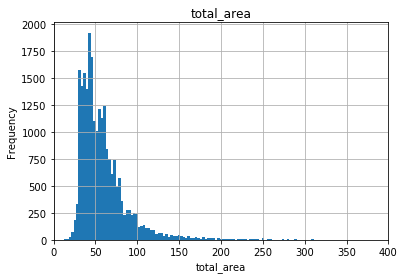

count    23545.000000
mean         2.070801
std          1.078529
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         19.000000
Name: rooms, dtype: float64

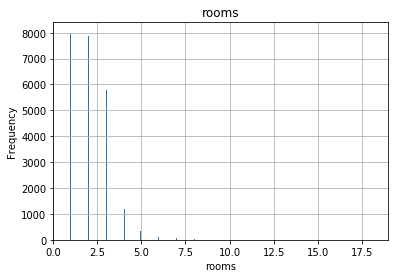

count    23545.000000
mean         2.737373
std          1.012526
min          1.000000
25%          2.600000
50%          2.700000
75%          2.700000
max        100.000000
Name: ceiling_height, dtype: float64

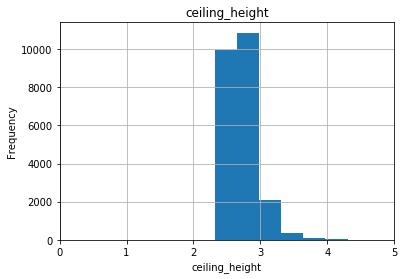

count    2.354500e+04
mean     6.543631e+06
std      1.091468e+07
min      1.219000e+04
25%      3.415000e+06
50%      4.650000e+06
75%      6.799000e+06
max      7.630000e+08
Name: last_price, dtype: float64

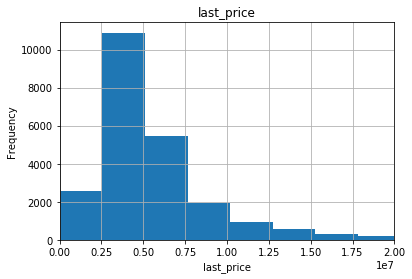

count    2.354500e+04
mean     9.945403e+04
std      5.037919e+04
min      1.110000e+02
25%      7.666600e+04
50%      9.500000e+04
75%      1.142590e+05
max      1.907500e+06
Name: cost_per_metr, dtype: float64

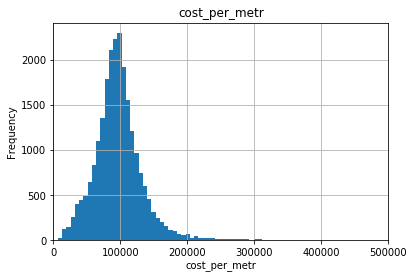

In [19]:
import matplotlib.pyplot as plt
columns = {'total_area': (0,400), 'rooms': (0,19),'ceiling_height': (0,5),'last_price':(0,20000000), 'cost_per_metr': (0,500000)}
for parametrs in columns.items():
    column = parametrs[0]
    scope = parametrs[1]
    display(data[column].describe())
    data[column].plot(kind = 'hist',bins = 300, grid = True, title = column, xlim = scope)
    plt.xlabel(column)
    plt.show()

Основной диапозон цен - 2.5-7.5 миллионов, цен за метр возьмем 30-150 тысяч.

По графикам можно сказать: большая часть площадей лежит в диапозоне 26-120 м^2, большинство квартир 1-4-ех комнатные, высота потолков в основном 2.25-3.25 метра. Выглядит правдоподобно, но есть выделяющиеся значения, например, высота потолков больше 4 метров,площадь больше 300 кв.м.

In [20]:
import plotly.express as px
columns = ['total_area', 'last_price', 'cost_per_metr', 'rooms', 'ceiling_height', 'days_exposition']
for column in data[columns].columns:
    print('Признак', column, ':')
    print(data[column].describe())
    fig = px.histogram(data, x = column, marginal = 'box', title = column)
    fig.show()

Признак total_area :
count    23545.000000
mean        60.319091
std         35.654414
min         12.000000
25%         40.000000
50%         52.000000
75%         70.000000
max        900.000000
Name: total_area, dtype: float64


Признак last_price :
count    2.354500e+04
mean     6.543631e+06
std      1.091468e+07
min      1.219000e+04
25%      3.415000e+06
50%      4.650000e+06
75%      6.799000e+06
max      7.630000e+08
Name: last_price, dtype: float64


Признак cost_per_metr :
count    2.354500e+04
mean     9.945403e+04
std      5.037919e+04
min      1.110000e+02
25%      7.666600e+04
50%      9.500000e+04
75%      1.142590e+05
max      1.907500e+06
Name: cost_per_metr, dtype: float64


Признак rooms :
count    23545.000000
mean         2.070801
std          1.078529
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         19.000000
Name: rooms, dtype: float64


Признак ceiling_height :
count    23545.000000
mean         2.737373
std          1.012526
min          1.000000
25%          2.600000
50%          2.700000
75%          2.700000
max        100.000000
Name: ceiling_height, dtype: float64


Признак days_exposition :
count    20376.000000
mean       180.767030
std        219.706953
min          1.000000
25%         45.000000
50%         95.000000
75%        231.000000
max       1580.000000
Name: days_exposition, dtype: float64


Более интерактивный пример

По некоторым признакам, таким как цена \ цена за квадрат \ высота потолков \ площади есть аномальные минимальные значения

,days_exposition
mean,180.76703
median,95.00000


count    20376.000000
mean       180.767030
std        219.706953
min          1.000000
25%         45.000000
50%         95.000000
75%        231.000000
max       1580.000000
Name: days_exposition, dtype: float64

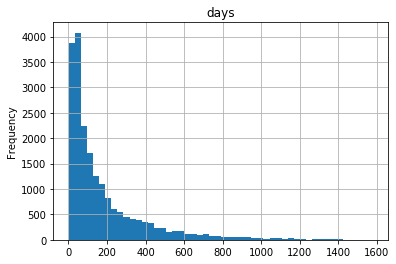

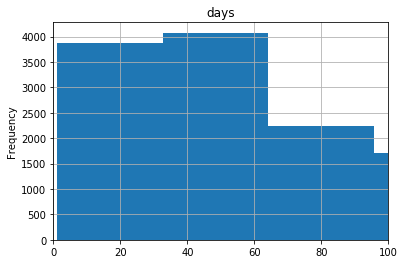

In [21]:
display(data.agg({'days_exposition':['mean','median']}))
display(data['days_exposition'].describe())
data['days_exposition'].plot(title = 'days',bins = 50, grid = True, kind = 'hist')
plt.show()
data['days_exposition'].plot(title = 'days',bins = 50, grid = True, kind = 'hist', xlim = (0,100))

Среднее в два раза отличается от медианы - значит есть сильно выделяющиеся значения.
В среднем уходит 95 дней на продажу квартиры, если продажа занимает меньше 64 дней, можно сказать, что это очень быстро. В случае, если продажа длится больше 510 дней, можно говорить, что это необычно долгое время.<br>
Значения взяты "на глаз", можно отделить 75% данных, отбросив выдающиеся 25%, для более общего подхода к анализу.

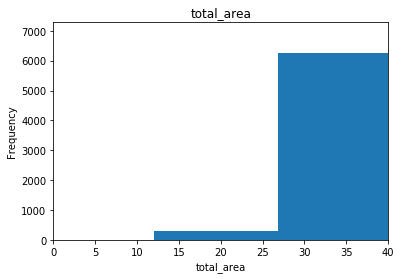

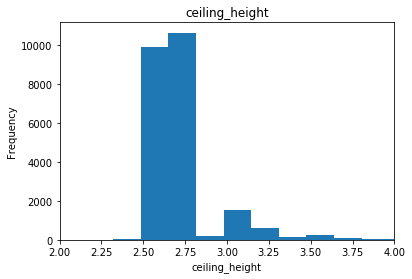

In [22]:
data['total_area'].plot(kind = 'hist', bins = 60, xlim = (0,40), title = 'total_area')
plt.xlabel('total_area')
plt.show()
data['ceiling_height'].plot(kind = 'hist', bins = 600, xlim = (2,4), title = 'ceiling_height')
plt.xlabel('ceiling_height')
plt.show()

Гистограммы построены для уточнения границ.

In [23]:
data_section = data.query(
    '(26 <= total_area <= 115) &\
     (1 <= rooms <= 4) &\
     (2.5 <= ceiling_height <=3.25) &\
     (1 <= days_exposition <= 510) &\
     (2500000 <= last_price <= 7500000) &\
     (30000 <= cost_per_metr <= 150000)')
data_section

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_around3000,ponds_nearest,days_exposition,cost_per_metr,day_exposition,month_exposition,year_exposition,group_floor,ratio_living_area_on_total_area,ratio_kitchen_area_on_total_area
1,7,3350000,40,2018-12-04,1,2.6,11,19,1,False,...,0,NaN,81,82920,Tuesday,December,2018,первый,0.460396,0.272277
5,10,2890000,30,2018-09-10,1,2.6,12,14,5,False,...,NaN,NaN,55,95065,Monday,September,2018,другой,0.473684,0.299342
6,6,3700000,37,2017-11-02,1,2.6,26,11,6,False,...,0,NaN,155,99195,Thursday,November,2017,другой,0.284182,0.386059
8,20,2900000,33,2018-05-23,1,2.7,27,15,26,False,...,NaN,NaN,189,87349,Wednesday,May,2018,другой,0.463855,0.265060
9,18,5400000,61,2017-02-26,3,2.5,9,44,7,False,...,0,NaN,289,88524,Sunday,February,2017,другой,0.714754,0.106557
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23553,6,3200000,39,2017-12-16,1,2.7,9,20,6,False,...,0,NaN,38,82051,Saturday,December,2017,другой,0.512821,0.282051
23555,13,3550000,35,2018-02-28,1,2.9,15,16,4,False,...,2,652,29,100566,Wednesday,February,2018,другой,0.461756,0.257790
23556,3,5500000,52,2018-07-19,2,2.7,5,31,2,False,...,0,NaN,15,105769,Thursday,July,2018,другой,0.596154,0.115385
23559,9,4600000,62,2016-08-05,3,2.6,9,40,8,False,...,1,675,239,73717,Friday,August,2016,другой,0.641026,0.128205


Создадим срез для проведения нашего исследования: оставим наиболее встречающиеся значения на основе гистограм.
Для площади был выделен диапозон 26-115 (более явная граница стоит на 100 кв.м., взяли небольшой запас для более полного описания) кв.м, высоты 2.5-3.25 м, комнат 1-4, дней продажи 1-510, цены 2.5-7.5 млн., цены квадратного метра 30-150 тыс.

In [24]:
data_section['total_area'] = data_section['total_area'].astype('int')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [25]:
data_section['last_price'].corr(data_section['total_area'])

0.6325425275649658

In [26]:
fig = px.scatter(data_section, x="last_price", y="total_area",
    trendline="ols", trendline_color_override = 'red', title ='зависимость цены от площади')
fig.show()

/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2580: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



Корреляция между площадью и стоимостью положительная и достаточная, чтобы утверждать, что имеется прямая взаимосвязь между параметрами.

In [27]:
data_section['last_price'].corr(data_section['rooms'])

0.442196608494451

In [28]:
fig = px.scatter(data_section, x="last_price", y="rooms",
    trendline="ols", trendline_color_override = 'red', title ='зависимость цены от кол-ва комнат')
fig.show()

Корреляция положительная, но недостаточная, чтобы говорить, что точно имеется прямая взаимосвязь между параметрами, возможно косвенное влияние.

In [29]:
data_section_additional = (data_section[['cityCenters_nearest', 'last_price']].dropna().astype('int'))
data_section_additional['last_price'].corr(data_section_additional['cityCenters_nearest'])

-0.2554820069613265

In [30]:
fig = px.scatter(data_section_additional, x="last_price", y="cityCenters_nearest",
    trendline="ols", trendline_color_override = 'red', title ='зависимость цены от кол-ва комнат')
fig.show()

Убрал пустые значения и изменил тип столбца, потому что в срезе имеются Nan-ы типа float, на которых выдает ошибку - тип float не имеет метода shape(). Видимо проблемы типа Int64.

Корреляция отрицательная, не сильно выраженная, возможно косвенное влияние между параметрами. Выглядит вполне логично: больше расстояние от центра - меньше стоимость жилья.

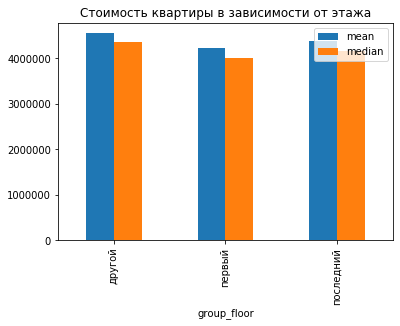

In [31]:
data_section.groupby('group_floor')['last_price'].agg(['mean','median']).plot(kind = 'bar', title = 'Стоимость квартиры в зависимости от этажа')

Зависимость цены от этажа следующая: первый этаж самый дешевый, последний дороже, остальные самые дорогие.

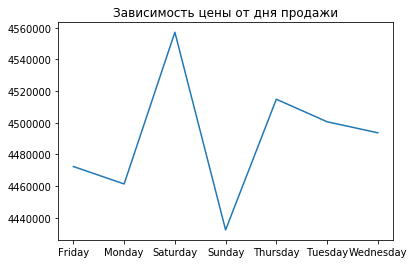

In [32]:
pivot_table_day_exposition = data_section.pivot_table(index = 'day_exposition',values ='last_price',aggfunc = 'mean')
plt.plot(pivot_table_day_exposition.index.values,pivot_table_day_exposition['last_price'])
plt.title('Зависимость цены от дня продажи')
plt.show()

Оказалось, во вторник среднее значение цены проданной квартиры выше остальных на 200 тысяч.

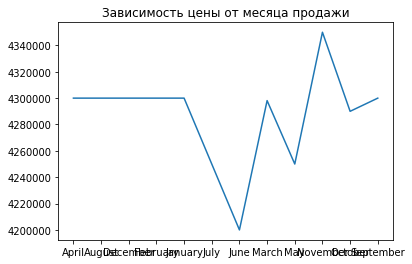

In [33]:
pivot_table_month_exposition = data_section.pivot_table(index = 'month_exposition',values ='last_price',aggfunc = 'median')
plt.plot(pivot_table_month_exposition.index.values,pivot_table_month_exposition['last_price'])
plt.title('Зависимость цены от месяца продажи')
plt.show()

Из графика можно сказать, что самые большие цены продажи в феврале, апреле, августе, сентябре, самые низкие - март,июнь.

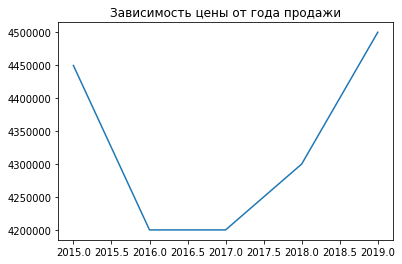

In [34]:
pivot_table_year_exposition = data_section.pivot_table(index = 'year_exposition',values ='last_price',aggfunc = 'median')
plt.plot(pivot_table_year_exposition.index.values,pivot_table_year_exposition['last_price'])
plt.title('Зависимость цены от года продажи')
plt.show()

С 2014 до 2015 был резкий спад на стоимость квартир (вероятно, кризис). С 2018 года наблюдается постоянный рост.

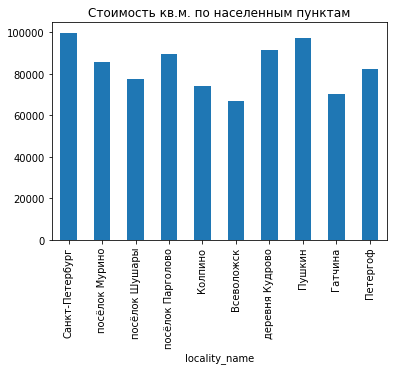

In [35]:
top_10_cities_count_ad = (data_section
    .groupby('locality_name')['cost_per_metr'].agg(['mean', 'count'])
    .sort_values(by = 'count', ascending = False)
    .head(10)
)
top_10_cities_count_ad['mean'].plot(kind = 'bar',title = 'Стоимость кв.м. по населенным пунктам')

Самое дорогое жилье оказалось, как ни странно, в Санкт-Петербурге, самое дешевое - во Всеволожске.

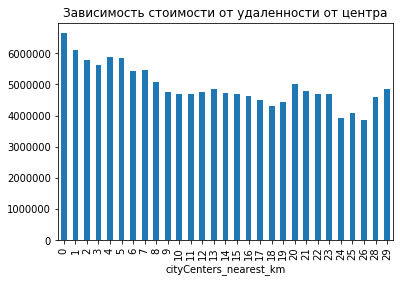

In [36]:
data_spb = data_section.query('locality_name  == "Санкт-Петербург"')
data_spb = data_spb.dropna(subset = ['cityCenters_nearest'])
data_spb['cityCenters_nearest_km'] = ((data_spb['cityCenters_nearest'] / 1000).round().astype('int'))
data_spb_group = data_spb.groupby('cityCenters_nearest_km')['last_price'].mean()
data_spb_group.plot(kind = 'bar', title = 'Зависимость стоимости от удаленности от центра')

По графику можно сказать, что центр находится в пределах 8 км, после 8 км начинается резкий спад цен. Следует отметить аномальные значения на 27 и 28 км.

In [37]:
data_spb.loc[data_spb['cityCenters_nearest_km'] <= 8, 'type_center'] = 'center'
data_spb.loc[data_spb['cityCenters_nearest_km'] > 8, 'type_center'] = 'out_center'

In [38]:
data_spb.pivot_table(index = 'type_center', values = ['total_area', 'last_price', 'rooms', 'ceiling_height', 'cost_per_metr'], aggfunc ='median')

,ceiling_height,cost_per_metr,last_price,rooms,total_area
type_center,,,,,
center,2.7,104166,5600000,2,52
out_center,2.7,97613,4500000,2,45


По сводной таблице можно сказать, что чем ближе к центру, тем больше площадь жилья и дороже квартиры, кв.м.

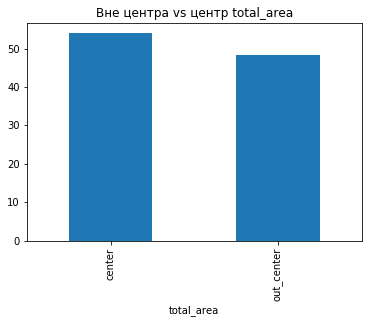

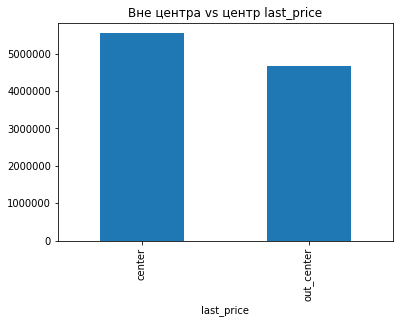

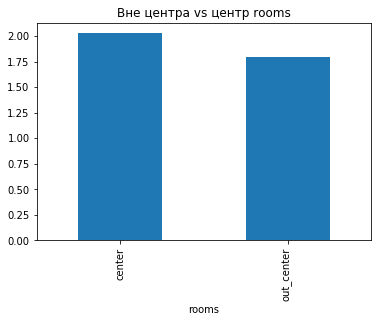

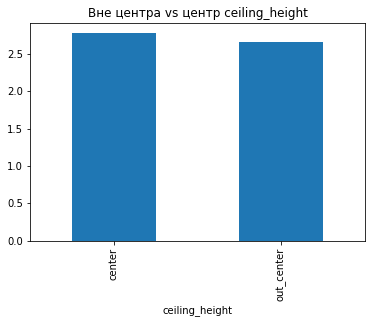

In [39]:
data_for_compare = data_spb.pivot_table(index = 'type_center', values = ['total_area', 'last_price', 'rooms', 'ceiling_height', 'cost_per_metr'], aggfunc ='mean')
for column in ['total_area', 'last_price', 'rooms', 'ceiling_height']:
    data_for_compare[column].plot(kind = 'bar',title = 'Вне центра vs центр ' +column)
    plt.xlabel(column)
    plt.show()

Основная площадь квартир в центре от 45 до 70 кв.м., кол-во комнат 2, высота потолков 2.7 метра. Для точного определения цены построим более детальный график.

в центре все значения оказались выше.

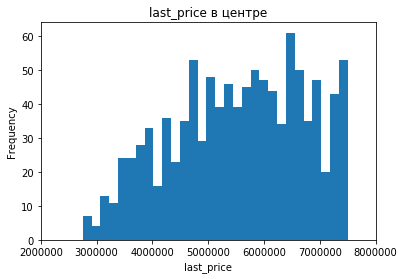

In [40]:
data_spb.loc[data_spb['type_center'] == 'center','last_price'].plot(kind = 'hist',title = 'last_price в центре', bins = 30, xlim= (2000000,8000000))
plt.xlabel('last_price')
plt.show()

В основном квартиры в центре стоят 4-7.5 миллионов.

In [41]:
fig = px.scatter_matrix(data_spb,
    dimensions=["last_price", "total_area", "cityCenters_nearest_km", "rooms", "ceiling_height"],
    color="type_center", width=2000, height=2000)
fig.show()

Совместная матрица для двух территорий

Таблица отражает графики зависимостей переменных, можно увидеть логичные выводы: при увеличении площади растет цена, при увеличении расстояния от центра и кол-ва комнат основная масса точек смещается в большую сторону по стоимости (кроме 4-ех комнатных квартир, тут что-то не то), при увеличении площади увеличивается кол-во комнат. Также квартиры с большей площадью располагаются ближе к центру.

In [42]:
data_spb_center_selective = data_spb.query('type_center == "center"')

In [43]:
data_spb_center_selective['last_price'].corr(data_spb_center_selective['total_area'])

0.6866328829315114

In [44]:
data_spb_center_selective['last_price'].corr(data_spb_center_selective['rooms'])

0.47450246430790166

In [45]:
data_spb_center_selective['last_price'].corr(data_spb_center_selective['cityCenters_nearest_km'])

-0.22358691178450654

In [46]:
data_spb_center_selective['last_price'].corr(data_spb_center_selective['year_exposition'])

0.021063409875349496

In [47]:
data_spb_center_selective = data_spb.sort_values(by = 'year_exposition')
fig1 = px.scatter(data_spb_center_selective, x = 'year_exposition', color = 'type_center',size ='last_price', y = 'last_price', title = 'Изменение цены в зав-ти от года')
fig1.show()

в 2015 вне центра квартиры стоили дороже, чем потом. Падения в кризис для центра не настолько сильное, как для основных данных

In [48]:
data_spb_center_selective[["last_price", "total_area", "cityCenters_nearest_km", "rooms", "ceiling_height"]].corr()

,last_price,total_area,cityCenters_nearest_km,rooms,ceiling_height
last_price,1.000000,0.759469,-0.213300,0.499647,0.263735
total_area,0.759469,1.000000,-0.056480,0.800492,0.163806
cityCenters_nearest_km,-0.213300,-0.056480,1.000000,-0.077926,-0.212120
rooms,0.499647,0.800492,-0.077926,1.000000,-0.040921
ceiling_height,0.263735,0.163806,-0.212120,-0.040921,1.000000


Все коэффициенты стали больше, теперь у них стал больший вес, кроме расстояния до центра. Как и подтвердалось, в центре расстояние влияет слабее на цену. По корреляции зависимость от года продажи не наблюдается,но в 2019 году минимальные цены на все квартиры резко выросли.

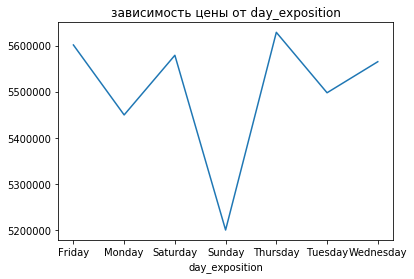

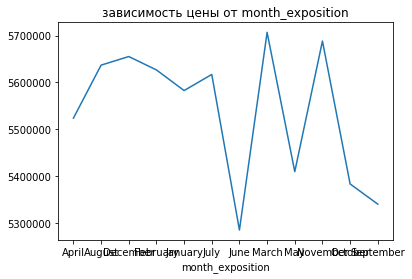

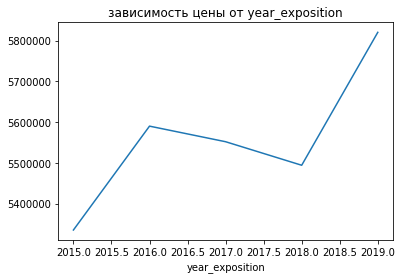

In [49]:
columns = ['day_exposition','month_exposition','year_exposition']
for column in columns:
    k = data_spb[data_spb['type_center'] == 'center'].groupby(column)['last_price'].agg('mean').reset_index()
    plt.plot(k[column], k['last_price'])
    plt.xlabel(column)
    plt.title('зависимость цены от ' + column)
    plt.show()

В субботу квартиры продаются хуже, как и в июне. В 2015 году квартиры стоили дешевле всего, в 2019 дороже всего - видимо, инфляция.

## Общий вывод

### План работы:
<a href='#the_destination'>Шаг 1. Получение общей информации и подготвка данных.</a><br>
<a href='#the_destination_2'>Шаг 2. Добавление фичей</a><br>
<a href='#the_destination_3'>Шаг 3. Исследовательский анализ данных.</a><br>
<a href='#the_destination_final'>Шаг 4. Общий вывод.</a><br>

<a id='the_destination_final'></a>

В присланном файле были выявлены и исправлены некорректные типы данных столбцов с количеством этажей(float- int), датой публикации(object - datetime), все типы столбцов с расстояниями до объектов и количество этих объектов в округе были измены на int, количество дней до снятия объявления так же сделано типом int.<p>
Пропуски в расстояниях до объектов скорее всего вызваны сбоем или невозможностью автоматической системы определить расстояние до объекта, либо невозможно найти объект (отсутствует в населенном пункте). Столбец с признаком апартаментов почти полностью содержит пропуски и имеет тип object. Было принято решение оставить этот столбец без изменений, чтобы не нарушать целостность данных,в столбце с количество балконов было множество пропусков, они были заменены на нулевые значения, пропуски появились вероятно из-за того, что оператор, вносящий данные, не вносил никакой информации о балконе, если его не было. Почти все данные в столбце апартаменты являются Nan-ами, возможно, данные в этот столбец заносятся редко, может это связано с особенностями работы в данной сфере, было бы неплохо уточниться у специалиста.Перевод столбца в тип bool не производим, потому что все Nan-ы будут засчитаны как False.
<p>Далее были добавлены столбцы с группой этажа и отношение жилой и кухонной площади к общей.
    После этого производился исследовательский анализ. На начальном этапе по построенным графикам удалось выяснить:<ul>
    <li>большая часть площадей лежит в диапозоне 26-120кв.м</li>
    <li>большинство квартир 1-4-ех комнатные</li>
    <li>высота потолков в основном 2.25-3.25 метра.</li>
    <li>Среднее в два раза отличается от медианы - значит есть сильно выделяющиеся значения. В среднем уходит 95 дней на продажу квартиры, если продажа занимает меньше 64 дней, можно сказать, что это очень быстро.</li>
    <li>В случае, если продажа длится больше 600 дней, можно говорить, что это необычно долгое время.</li>
    </ul><p>
    Потом был создан срез для проведения исследования: оставили наиболее встречающиеся значения на основе построенных гистограм. Диапозоны по срезу:
    <ul>
        <li>для площади 26-115 кв.м</li>
        <li>высоты 2.5-3.25 м</li>
        <li>комнат 1-4</li>
        <li>дней продажи 1-510.</li>
        <li>цены 2.5-7.5 млн.</li>
        <li> цена за кв. метр 30-150 тыс.</li></ul><p> Количество строк уменьшилось в два раза, в основном это связано из-за пропусков в столбце с высотой потолков. <p>
    По этим данным были рассчитаны корреляции:<ul>
    <li>возможно слабое отрицательное влияние между расстоянием до центра и ценой: корреляция отрицательная, не сильно выраженная. Выглядит вполне логично: больше расстояние от центра - меньше стоимость жилья.</li>
    <li>Корреляция между ценой и кол-вом комнат положительная, но недостаточная, чтобы говорить, что  имеется сильная взаимосвязь.</li>
    <li>Корреляция между площадью и стоимостью положительная и достаточная, чтобы утверждать, что имеется сильная взаимосвязь между параметрами.</li></ul><p>
    После выявлена следующая зависимость цены от этажа: первый этаж самый дешевый, последний дороже, остальные самые дорогие.<p>
    Удалось выяснить, во вторник среднее значение цены проданной квартиры выше остальных на 200 тысяч.С 2014 до 2015 был резкий спад на стоимость квартир. С 2018 года наблюдается постоянный рост. Cамые большие цены продажи в феврале, апреле, августе, сентябре, самые низкие - март,июнь.<p>
    Самое дорогое жилье оказалось в Санкт-Петербурге, самое дешевое - во Всеволожске. По построенному графику средней цены жилья можно сказать, что центр находится в пределах 8 км, после 8 км начинается резкий спад цен. Следует отметить аномальные значения на 27 и 28 км. <p>
    Основная площадь квартир в центре от 60 до 100 кв.м., кол-во комнат 2-3, высота потолков 3-3.2 метра В основном квартиры стоят 4-7.5 миллионов.<p>
    Все коэффициенты корреляции для центра стали больше, теперь у них стал больший вес, кроме расстояния до центра. Как и подтверждалось, в центре расстояние влияет слабее на цену.<p>
        Как и везде, в центре СПб квартиры продаются хуже в воскресенье, в остальные дни лучше. С месяцами схожая ситуация в мае и июне, в сентябре картина противоположна: в СПб спад, везде подъем. По годам противоположная ситуация в 2015-2016 годах, в остальном одинаково - повышение цен.<br>
     Проводя сравнение между центром Санкт-Петербурга и всех населенных пунктов, можно выделить следующие различия:<ul>
         <li>средняя площадь квартир: центр СПб - 60-100кв.м, остальные 26-115кв.м</li>
         <li>средняя высота потолка: центр СПб - 3-3.2м, остальные 2.5-3.25м</li>
         <li>среднее число комнат: центр СПб - 2-3, остальные 1-4</li>
         <li>средняя стоимость квартиры: центр СПб - 4-7.5 млн., остальные 3-5 млн.</li>
         <li>среднее время продажи: центр СПб- 116 дней, остальные - 95 дней.</li></ul>